# Большие данные мобильного оператора

Предоставлены данные мобильного оператора за февраль 2020 г.  для оценки демографической ситуации в г. Перми.

### Цель: 

**Осуществить анализ численности и распределения населения г. Перми в разрезе различных категорий**

**Результатом вашей работы должны стать ответы на вопросы:**

1.	Как распределено население в г. Пермь? Какие основные домашние и рабочие локации?
2.	Где проживает больше всего детей в г. Пермь?
3.	Где проживает больше всего пенсионеров в г. Пермь?
4.	Каковы основные центры притяжения рабочей силы в г. Пермь?
5.	В каких районах следует искать свою 2-ю половинку?
6.	В каких районах следует искать высокооплачиваемую работу?
7.	В каких районах города проживает население с низким доходом?
8.	Каков усредненный портрет жителя г. Перми?


**Описание исходных данных**

Исходные данные содержат в себе 2 таблицы:

1.	Таблица 1 (202002_csv) – статистика по абонентам мобильного оператора
2.	Таблица 2 (p_grid_csv)– координаты высокогранулярных зон г. Перми


In [3]:
#Импорт необходимых библиотек
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import json
%matplotlib inline

In [4]:
#Прочитаю данные

stat_df = pd.read_csv('/Users/daryakondrateva/тестовые_задания/Кейс_большие данные_мобильного_оператора/202002_csv.csv',sep=';')
coord_df = pd.read_csv('/Users/daryakondrateva/тестовые_задания/Кейс_большие данные_мобильного_оператора/p_grid_csv.csv',sep=';')

**stat_df - Статистика по абонентам мобильного оператора**

**coord_df - Координаты высокогранулярных зон г. Перми**

In [5]:
#Функция для отображения информации о дф

def review(data):
    display(data.head(5))
    print(data.info())
    print('Пропуски:', data.isna().sum())
    print('Явные дубликаты:')
    if data.duplicated().sum() > 0:
        print(data.duplicated().sum())
    else:
        print('Не найдено')

**stat_df - Статистика по абонентам мобильного оператора**

In [6]:
review(stat_df)

,column1,dt,zid,sex,age,income,cnt_home,cnt_work,cnt_night
0,0,2020-02-29,212702201,3,7,2,0,0,0
1,1,2020-02-29,212734969,2,4,5,0,0,0
2,2,2020-02-29,212767738,3,6,6,0,0,0
3,3,2020-02-29,212800503,3,0,6,0,0,0
4,4,2020-02-29,212800505,3,1,4,0,0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304848 entries, 0 to 304847
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   column1    304848 non-null  int64 
 1   dt         304848 non-null  object
 2   zid        304848 non-null  int64 
 3   sex        304848 non-null  int64 
 4   age        304848 non-null  int64 
 5   income     304848 non-null  int64 
 6   cnt_home   304848 non-null  int64 
 7   cnt_work   304848 non-null  int64 
 8   cnt_night  304848 non-null  int64 
dtypes: int64(8), object(1)
memory usage: 20.9+ MB
None
Пропуски: column1      0
dt           0
zid          0
sex          0
age          0
income       0
cnt_home     0
cnt_work     0
cnt_night    0
dtype: int64
Явные дубликаты:
Не найдено


**coord_df - Координаты высокогранулярных зон г. Перми**

In [7]:
review(coord_df)

,tile_id,coords,type_geom
0,212702201,"[[[56.173096, 57.862288], [56.173096, 57.86813...",Polygon
1,212734967,"[[[56.151123, 57.868132], [56.151123, 57.87397...",Polygon
2,212734968,"[[[56.162109, 57.868132], [56.162109, 57.87397...",Polygon
3,212734969,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon
4,212734970,"[[[56.184082, 57.868132], [56.184082, 57.87397...",Polygon


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2117 entries, 0 to 2116
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   tile_id    2117 non-null   int64 
 1   coords     2117 non-null   object
 2   type_geom  2117 non-null   object
dtypes: int64(1), object(2)
memory usage: 49.7+ KB
None
Пропуски: tile_id      0
coords       0
type_geom    0
dtype: int64
Явные дубликаты:
Не найдено


В первой таблице, где у представлена статистика по абонентам мобильного оператора нужно конвертировать столбец с датой в правильный тип данных

In [8]:
#Конвертирую в дату
stat_df['dt'] = pd.to_datetime(stat_df['dt'])

Для работы с такими категориальными данными, где возраст, пол и уровень дохода представлен числами, которые имеют определенное значение, удобно будет создать новые колонку, в которых будет прописана соответствующая категория для каждой цифры.

In [9]:
#Функ-ии для добавления соответствующей категории для каждой цифры
def add_age(x):
    if x == 0:
        return "меньше 18"
    if x == 1:
        return "18-24 года"
    if x == 2:
        return "25-34 года"
    if x == 3:
        return "35-44 года"
    if x == 4:
        return "45-54 года"
    if x == 5:
        return "55-64 года"
    if x == 6:
        return "65 лет и больше"
    if x == 7:
        return "Н/Д"
    
def add_sex(x):
    if x == 1:
        return 'Мужчина'
    if x == 2:
        return 'Женщина'
    else:
        return "Н/Д"
    
def add_income(x):
    if x == 1:
        return "до 30 тыс. руб."
    if x == 2:
        return "от 30 до 50 тыс. руб."
    if x == 3:
        return "от 50 до 70 тыс. руб."
    if x == 4:
        return "от 70 до 100 тыс. руб."
    if x == 5:
        return "свыше 100 тыс. руб."
    if x == 6:
        return "Категория не определена (Н/Д)"

In [10]:
stat_df['age_name'] = stat_df['age'].apply(add_age)
stat_df['sex_name'] = stat_df['sex'].apply(add_sex)
stat_df['income_name'] = stat_df['income'].apply(add_income)

In [11]:
stat_df.head()

,column1,dt,zid,sex,age,income,cnt_home,cnt_work,cnt_night,age_name,sex_name,income_name
0,0,2020-02-29,212702201,3,7,2,0,0,0,Н/Д,Н/Д,от 30 до 50 тыс. руб.
1,1,2020-02-29,212734969,2,4,5,0,0,0,45-54 года,Женщина,свыше 100 тыс. руб.
2,2,2020-02-29,212767738,3,6,6,0,0,0,65 лет и больше,Н/Д,Категория не определена (Н/Д)
3,3,2020-02-29,212800503,3,0,6,0,0,0,меньше 18,Н/Д,Категория не определена (Н/Д)
4,4,2020-02-29,212800505,3,1,4,0,0,0,18-24 года,Н/Д,от 70 до 100 тыс. руб.


In [12]:
#Для подсчета кол-во наблюдений добавим колонку с общей численностью человек
stat_df['cnt_all'] = stat_df['cnt_home'] + stat_df['cnt_night'] + stat_df['cnt_work']

In [13]:
nd = stat_df[(stat_df['sex_name'] == "Н/Д") & (stat_df['age_name'] == "Н/Д") & (stat_df['income_name'] == "Категория не определена (Н/Д)")]

В столбцах: пол, возраст, уровень дохода есть значения, которые указаны как "категория не определена". Посмотрю на объем таких данных, чтобы принять решение исключать ли такие записи из анализа или оставить их.

In [14]:
print('Процент Н/Д общей численности: {}'.format(round((stat_df[(stat_df['sex_name'] == "Н/Д") & (stat_df['age_name'] == "Н/Д") & (stat_df['income_name'] == "Категория не определена (Н/Д)")].cnt_all.sum() / stat_df.cnt_all.sum()) * 100,2)))

Процент Н/Д общей численности: 0.05


Процент записей с неизвестными значениями для пола, возраста и уровня дохода составляет всего 0.05% данных, это говорит о том, что пропущенные значения в наборе данных являются довольно незначительными и составляют всего лишь небольшую долю от общего объема данных. Поэтому я их не буду брать в анализ. 

In [15]:
#Возьму данные, где категории пола, возраста и уровня дохода определены.
dfstat = stat_df[(stat_df['sex_name'] != "Н/Д") & (stat_df['age_name'] != "Н/Д") & (stat_df['income_name'] != "Категория не определена (Н/Д)")]

In [16]:
dfstat.shape

(148190, 13)

1. Посмотрю за какой день представлены данные

In [17]:
#Данные представлены за 29 февраля 2020 г
dfstat.dt.value_counts()

dt
2020-02-29    148190
Name: count, dtype: int64

Посмотрим на распределние категориальных переменных

Для построения половозрастной диаграмы подготовлю два отдельных дф с кол-вом муж и женщин в каждой возрастной группе.

In [18]:
male_age = dfstat[dfstat['sex_name'] == 'Мужчина'].groupby('age_name').agg({'cnt_all':'sum'}).reset_index() \
        .rename(columns={'cnt_all':'male_count'}).sort_values('male_count',ascending=False)
female_age = dfstat[dfstat['sex_name'] == 'Женщина'].groupby('age_name').agg({'cnt_all':'sum'}).reset_index() \
        .rename(columns={'cnt_all':'female_count'}).sort_values('female_count',ascending=False)

In [19]:
all = male_age.male_count.sum() + female_age.female_count.sum()
female_pr = round((female_age.female_count.sum()/all)*100,2)
male_pr = round((male_age.male_count.sum()/all)*100,2)

In [20]:
print(f'Кол-во муж.: {male_age.male_count.sum()}')
print(f'Кол-во жен.: {female_age.female_count.sum()}')

print(f'''
Процентное соотношение мужчин составляет около {male_pr}%, а процентное соотношение женщин составляет около {female_pr}%.
''')

Кол-во муж.: 1174598
Кол-во жен.: 1295978

Процентное соотношение мужчин составляет около 47.54%, а процентное соотношение женщин составляет около 52.46%.



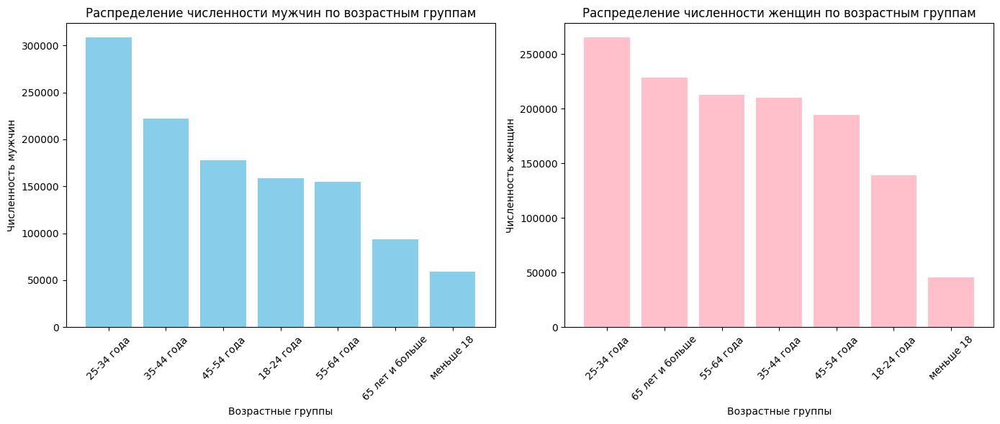

In [21]:
# Создание подграфиков
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Первый график: распределение численности мужчин по возрастным группам
ax1.bar(male_age['age_name'], male_age['male_count'], color='skyblue')
ax1.set_xlabel('Возрастные группы')
ax1.set_ylabel('Численность мужчин')
ax1.set_title('Распределение численности мужчин по возрастным группам')
ax1.tick_params(axis='x', rotation=45)

# Второй график: распределение численности женщин по возрастным группам
ax2.bar(female_age['age_name'], female_age['female_count'], color='pink')
ax2.set_xlabel('Возрастные группы')
ax2.set_ylabel('Численность женщин')
ax2.set_title('Распределение численности женщин по возрастным группам')
ax2.tick_params(axis='x', rotation=45)

# Отобразить графики
plt.tight_layout()
plt.show()

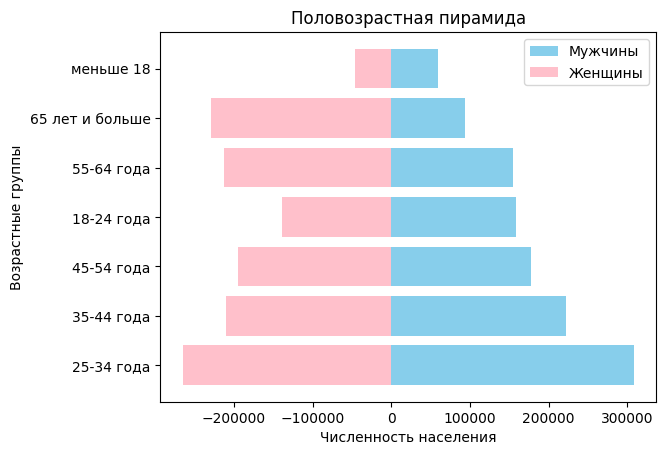

In [22]:
fig, ax = plt.subplots()
ax.barh(male_age.age_name, male_age.male_count, color='skyblue', label='Мужчины')
ax.barh(female_age.age_name, [-x for x in female_age.female_count], color='pink', label='Женщины')  # Отрицательные значения для отображения слева
ax.set_xlabel('Численность населения')
ax.set_ylabel('Возрастные группы')
ax.set_title('Половозрастная пирамида')
ax.legend()
plt.show()

Анализ полученных данных о распределении численности мужчин и женщин по возрастным группам позволяет сделать несколько выводов:

1. **Мужчины:**
- Большая часть мужчин (более 50%) сконцентрирована в возрастных группах от 25 до 45 лет. Это указывает на то, что эти возрастные категории представлены наибольшим числом мужчин.
- С увеличением возраста количество мужчин постепенно снижается, причем наибольшее падение численности происходит после возраста 55 лет. Это может быть связано с физиологическими особенностями или социокультурными факторами. 

2. **Женщины:**
- В отличие от мужчин, у женщин наибольшее количество представительниц сосредоточено в возрастной группе 25-34 лет. Это может быть связано с активным репродуктивным возрастом и социокультурными факторами.
- Также высокая численность женщин наблюдается в возрастной группе 65 лет и старше. Это может указывать на то, что пожилая часть женского населения больше интересуется услугами мобильного оператора. И говорит о продолжительности жизни женщин. Возможно, женщины в этом возрасте наиболее активны, чем мужчины. 

Также в данных женщин по чилсенности больше чем мужчин на примерно **10%**. Это может говорить о разных причинах. Например:
- Это может отражать общую демографическую ситуацию в стране - городе;
- Возможно, мобильный оператор привлекает больше женщин из-за своих услуг, тарифов или маркетинговой стратегии, которая привлекает именно женскую аудиторию. 

Для построения диаграмы по уроню дохода каждой половой группы подготовлю два отдельных дф с кол-вом муж и женщин в каждой доходной группе.

In [23]:
#Построила сводную по каждой категории дохода по полу
dfstat.groupby(['sex_name','income_name']).agg({'cnt_all':'sum'}).pivot_table(
    index = 'income_name',
    columns= 'sex_name',
    values = 'cnt_all',
    aggfunc= 'sum')

sex_name,Женщина,Мужчина
income_name,,
до 30 тыс. руб.,782866,572815
от 30 до 50 тыс. руб.,401425,453342
от 50 до 70 тыс. руб.,70674,90899
от 70 до 100 тыс. руб.,30535,40639
свыше 100 тыс. руб.,10478,16903


In [24]:
#Создам массив удобный для постраения графика
income_df = dfstat.groupby(['sex_name','income_name']).agg({'cnt_all':'sum'}).reset_index()

In [25]:
income_df

,sex_name,income_name,cnt_all
0,Женщина,до 30 тыс. руб.,782866
1,Женщина,от 30 до 50 тыс. руб.,401425
2,Женщина,от 50 до 70 тыс. руб.,70674
3,Женщина,от 70 до 100 тыс. руб.,30535
4,Женщина,свыше 100 тыс. руб.,10478
5,Мужчина,до 30 тыс. руб.,572815
6,Мужчина,от 30 до 50 тыс. руб.,453342
7,Мужчина,от 50 до 70 тыс. руб.,90899
8,Мужчина,от 70 до 100 тыс. руб.,40639
9,Мужчина,свыше 100 тыс. руб.,16903


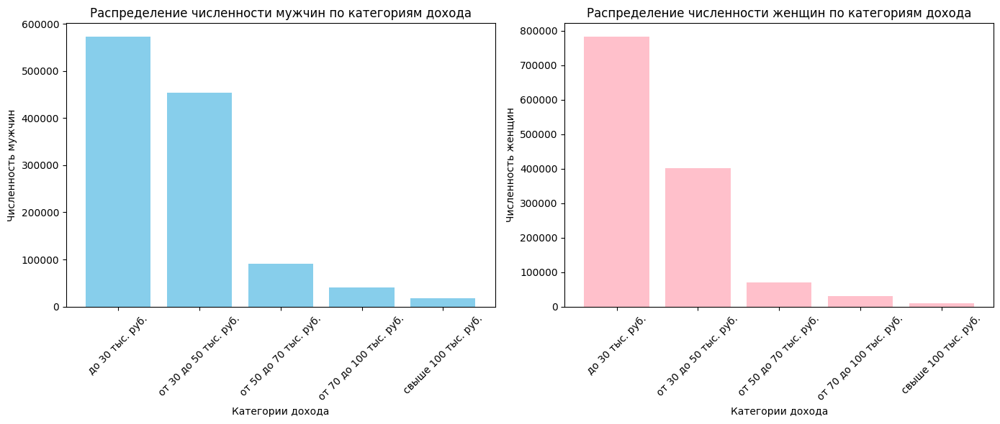

In [26]:
# Создание подграфиков
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Первый график: распределение численности мужчин по категориям дохода
ax1.bar(income_df.query('sex_name == "Мужчина"')['income_name'], income_df.query('sex_name == "Мужчина"')['cnt_all'], color='skyblue')
ax1.set_xlabel('Категории дохода')
ax1.set_ylabel('Численность мужчин')
ax1.set_title('Распределение численности мужчин по категориям дохода')
ax1.tick_params(axis='x', rotation=45)

# Первый график: распределение численности мужчин по категориям дохода
ax2.bar(income_df.query('sex_name == "Женщина"')['income_name'], income_df.query('sex_name == "Женщина"')['cnt_all'], color='pink')
ax2.set_xlabel('Категории дохода')
ax2.set_ylabel('Численность женщин')
ax2.set_title('Распределение численности женщин по категориям дохода')
ax2.tick_params(axis='x', rotation=45)
# Отобразить графики
plt.tight_layout()
plt.show()

Анализ полученных данных о распределении уровня дохода по возрастным группам позволяет сделать несколько выводов:

1. **Большинство клиентов с уровнем дохода до 30тыс.руб.**. Как среди женщин, так и среди мужчин наибольшее количество клиентов имеют доход до 30 тыс. рублей. Это может указывать на то, что значительная часть клиентов находится в низком доходном сегменте.
2. Различия в доходах между полами: Из данных видно, что среди клиентов мужского пола преобладают те, у кого доход находится в более высоких диапазонах, чем среди клиентов женского пола. Например, численность мужчин с доходом **от 30 тыс.руб. до 50 тыс.руб.** больше чем численность женщин с таким доходом.
3. Небольшое кол-во килентов с высоким уровнем дохода. Всего 1% от общего кол-ва клиентов имеют доход свыше 100 тыс.руб. Это может указывать на то, что клиенты с высоким доходом представляют собой меньшинство в данном наборе данных.

**Распределение «домашних», «рабочих» и «ночных» локаций по числу жителей**

In [27]:
# Посчитаем общее количество жителей для каждой категории
total_home = dfstat['cnt_home'].sum()
total_work = dfstat['cnt_work'].sum()
total_night = dfstat['cnt_night'].sum()

# Посчитаем общее количество жителей во всех категориях
total_population = total_home + total_work + total_night

# Вычислим долю каждой категории от общего числа жителей
home_distribution = round(total_home / total_population,2)
work_distribution = round(total_work / total_population,2)
night_distribution = round(total_night / total_population,2)

print("Доля домашних жителей:", home_distribution)
print("Доля рабочих жителей:", work_distribution)
print("Доля ночных жителей:", night_distribution)

Доля домашних жителей: 0.36
Доля рабочих жителей: 0.24
Доля ночных жителей: 0.41


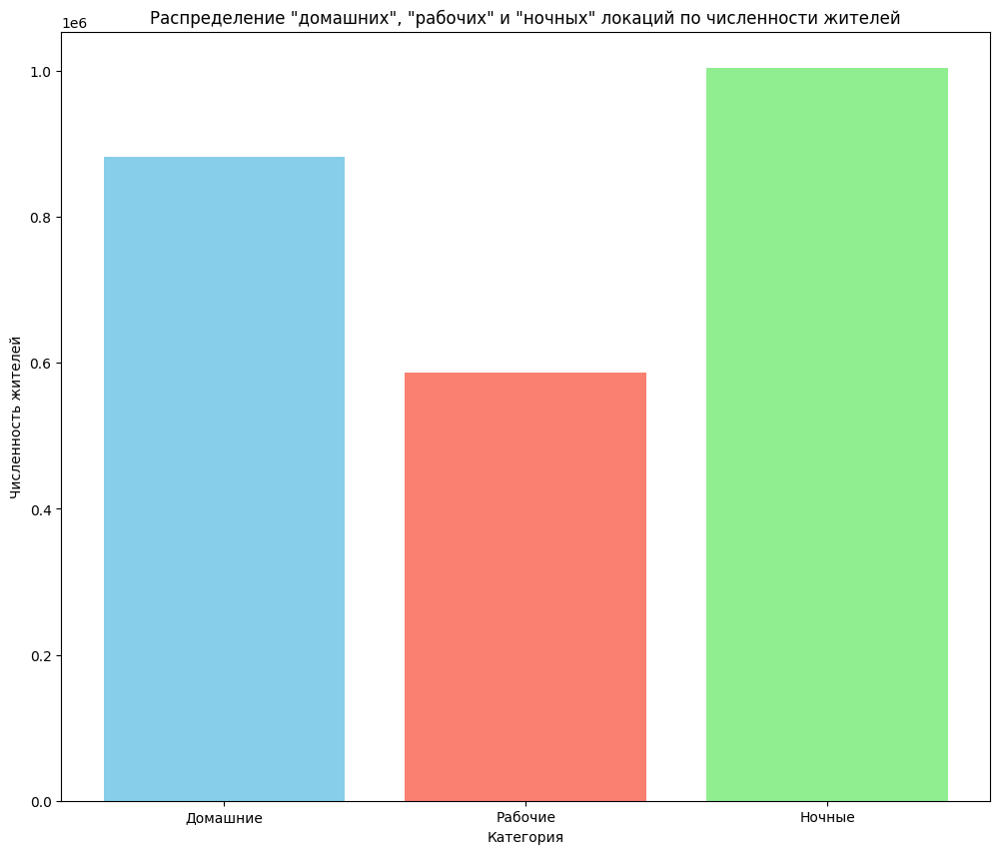

In [28]:
# Создаем список категорий
categories = ['Домашние', 'Рабочие', 'Ночные']

# Создаем список с количеством жителей для каждой категории
population_counts = [total_home, total_work, total_night]

# Строим столбчатую диаграмму
plt.figure(figsize=(12, 10))
plt.bar(categories, population_counts, color=['skyblue', 'salmon', 'lightgreen'])
plt.xlabel('Категория')
plt.ylabel('Численность жителей')
plt.title('Распределение "домашних", "рабочих" и "ночных" локаций по численности жителей')
plt.show()

На основании предоставленных значений распределения по зонам "Домашние", "Рабочие" и "Ночные" можно сделать следующие выводы:

1. **Домашние зоны (881 172)**: Численность абонентов мобильного оператора, которые проживают данной зоне в определенный период времени. Вероятно, в этих зонах абоненты наиболее активно используют сеть оператора для звонков, отправки сообщений, использования мобильного интернета и других услуг.
2. **Рабочие зоны (586 349)**: Это количество абонентов мобильного оператора, которые находятся в рабочих зонах в определенный период времени. В рабочих зонах абоненты, возможно, используют мобильную связь и интернет для рабочих целей, деловых переговоров, обмена информацией и других деятельностей, связанных с работой.
3. **Ночные зоны (1 003 055)**: Это количество абонентов мобильного оператора, находящихся в ночное время в определенных зонах. Вероятно, в этих зонах абоненты могут активно использовать мобильную связь для различных целей, включая развлечения, общение, доступ в интернет и другие активности.

Посмотрю по зонам какие категории граждан преобладают.

**зона проживания**

In [29]:
home = dfstat.groupby(['sex_name',
                'age_name',
                'income_name']).agg({'cnt_home':'sum'}).reset_index().sort_values('cnt_home',ascending=False)


# Соединяем значения столбцов 'sex', 'age' и 'income' в один портрет
home['portrait'] = home['sex_name'].astype(str) + '_' + home['age_name'] + '_' + home['income_name']

# Находим наиболее часто встречающийся портрет
most_common_portrait_home = home['portrait'].value_counts().idxmax()

print('Наиболее часто встречающийся портрет в "Зоне проживания":')
print(most_common_portrait_home)

Наиболее часто встречающийся портрет в "Зоне проживания":
Женщина_25-34 года_до 30 тыс. руб.


**зона ночевки на территории г. Пермь**

In [30]:
night = dfstat.groupby(['sex_name',
                'age_name',
                'income_name']).agg({'cnt_night':'sum'}).reset_index().sort_values('cnt_night',ascending=False)

# Соединяем значения столбцов 'sex', 'age' и 'income' в один портрет
night['portrait'] = night['sex_name'].astype(str) + '_' + night['age_name'] + '_' + night['income_name']

# Находим наиболее часто встречающийся портрет
most_common_portrait_night = night['portrait'].value_counts().idxmax()

print('Наиболее часто встречающийся портрет в "Зоне ночевки":')
print(most_common_portrait_night)

Наиболее часто встречающийся портрет в "Зоне ночевки":
Женщина_65 лет и больше_до 30 тыс. руб.


**Зона работы**


In [31]:
work = dfstat.groupby(['sex_name',
                'age_name',
                'income_name']).agg({'cnt_work':'sum'}).reset_index().sort_values('cnt_work',ascending=False)

# Соединяем значения столбцов 'sex', 'age' и 'income' в один портрет
work['portrait'] = work['sex_name'].astype(str) + '_' + work['age_name'] + '_' + work['income_name']

# Находим наиболее часто встречающийся портрет
most_common_portrait_work = work['portrait'].value_counts().idxmax()

print('Наиболее часто встречающийся портрет в "Зоне работы":')
print(most_common_portrait_work)

Наиболее часто встречающийся портрет в "Зоне работы":
Мужчина_25-34 года_от 30 до 50 тыс. руб.


**Исходя из информации о наиболее часто встречающихся портретах в "Зоне проживания", "Зоне ночевки" и "Зоне работы" по данным мобильного оператора, можно сделать следующие предположения:**

1. **Зона проживания:** Наиболее часто встречающийся портрет - **Женщина_25-34 года_до 30 тыс. руб., а на третьем месте по численности Мужчина_25-34 года_от 30 до 50 тыс. руб.**. В данной зоне проживают в основном молодые люди в возрасте от 25 до 34 лет. Это может быть связано с особенностями жилья, расположением зоны относительно рабочих мест или другими факторами, привлекающими молодежь.

2. **Зона ночевки:** Наиболее часто встречающийся портрет - **Женщина_65 лет и больше_до 30 тыс. руб. и Женщина_25-34 года_до 30 тыс. руб.** может указывать на то, что в данной зоне ночевки проживают в основном женщины с низким доходом. Эти данные показывают, что эта зона привлекательна для людей с ограниченными финансовыми возможностями. Это может быть связано с дешевым жильем в этом месте.

3. **Зона работы:** Наиболее часто встречающийся портрет - **"Мужчина_25-34 года_от 30 до 50 тыс. руб."** может указывать на то, что в данной зоне работы преобладают молодые мужчины с доходом от 30 до 50 тыс. рублей.

**Определим наиболее часто встречающиеся атрибуты по каждой зоне:**

1. Зона ночевки:

- Женщина
- 65 лет и старше
- Доход до 30 тыс. рублей в месяц

2. Зона проживания:

- Женщина
- 25-34 года
- Доход до 30 тыс. рублей в месяц

3. Зона работы:

- Мужчина
- 25-34 года
- Доход от 30 до 50 тыс. рублей в месяц


### Часть 2: Анализ данных с помощью электронной карты

Используя статистику по абонентам мобильного оператора за февраль 2020 г. и координаты локаций нужно **провести аналитику демографической ситуации в г. Пермь**

Используя координаты высокогранулярной сетки необходимо продемонстрировать на карте:

1.	Суммарное распределение населения по «Рабочей», «домашней» и «ночной» локациям в г. Пермь;
2.	Распределение детей до 18 лет по «домашним» локациям на территории г. Перми;
3.	Распределение пенсионеров старше 65 лет по «домашним» локациям на территории г. Перми
4.	Распределение рабочей силы (18-64 лет) по рабочим локациям г. Перми;
5.	Соотношение мужчин/женщин в возрасте 18-24 лет в локациях в г. Перми без учета типа локации, причем в локации должно быть не меньше 100 человек;
6.	Распределение населения по «рабочим» локациям с доходом свыше 100 тыс. рублей в г. Перми;
7.	Распределение населения по «домашним» локациям с доходом меньше 30 тыс. рублей




In [32]:
#Подготовлю дф. Объединю два датафрейма, чтобы получить идентификационный номер зоны

coord_df.rename(columns={'tile_id':'zid'},inplace=True)
dfs = dfstat.merge(coord_df,how = 'inner',on='zid')

В дальнейшей работе я буду работать с массивом данных **dfs**.

In [33]:
dfs.head()

,column1,dt,zid,sex,age,income,cnt_home,cnt_work,cnt_night,age_name,sex_name,income_name,cnt_all,coords,type_geom
0,1,2020-02-29,212734969,2,4,5,0,0,0,45-54 года,Женщина,свыше 100 тыс. руб.,0,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon
1,6,2020-02-29,212833274,1,6,1,0,0,0,65 лет и больше,Мужчина,до 30 тыс. руб.,0,"[[[56.184082, 57.885657], [56.184082, 57.89149...",Polygon
2,11,2020-02-29,212866042,1,1,5,0,0,0,18-24 года,Мужчина,свыше 100 тыс. руб.,0,"[[[56.184082, 57.891497], [56.184082, 57.89733...",Polygon
3,13,2020-02-29,212931571,1,3,2,8,0,8,35-44 года,Мужчина,от 30 до 50 тыс. руб.,16,"[[[56.107178, 57.903174], [56.107178, 57.90901...",Polygon
4,14,2020-02-29,212931572,1,6,2,0,0,0,65 лет и больше,Мужчина,от 30 до 50 тыс. руб.,0,"[[[56.118164, 57.903174], [56.118164, 57.90901...",Polygon


In [34]:
#Функции для определения цветовой шкалы   
def cod_color(x):
    if x == 0:
        return '848482'
    if 0 < x <= 200:
        return '008000'
    if 200 < x <= 500:
        return 'ffff00'
    if 500 < x <= 1000:
        return 'ff9900'
    if x> 1000:
        return 'ff0000'

### Суммарное распределение населения по «Рабочей», «домашней» и «ночной» локациям в г. Пермь


Посчитаю по каждому идентификационному номеру зоны территориального разделения численность населения по «Рабочей», «домашней» и «ночной» локациям в г. Пермь. Подготовлю дф для дальнейшей работы

In [35]:
total_zone = dfs.groupby(['zid','coords','type_geom']).agg({'cnt_home':'sum',
                        'cnt_night':'sum',
                        'cnt_work':'sum'}).reset_index()
#Выделю в отдельные дф по зонам 
total_home_z = total_zone[['zid','coords','type_geom','cnt_home']]
total_night_z = total_zone[['zid','coords','type_geom','cnt_night']]
total_work_z = total_zone[['zid','coords','type_geom','cnt_work']]

total_zone.head()

,zid,coords,type_geom,cnt_home,cnt_night,cnt_work
0,212702201,"[[[56.173096, 57.862288], [56.173096, 57.86813...",Polygon,0,0,0
1,212734967,"[[[56.151123, 57.868132], [56.151123, 57.87397...",Polygon,0,0,0
2,212734968,"[[[56.162109, 57.868132], [56.162109, 57.87397...",Polygon,32,45,0
3,212734969,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon,0,127,72
4,212734970,"[[[56.184082, 57.868132], [56.184082, 57.87397...",Polygon,0,4,0


In [36]:
#Добавлю цвет и код цвета 

#Добавлю в массив с домашней зоной
total_home_z['stroke'] = total_zone['cnt_home'].apply(cod_color)
total_home_z = total_home_z[['zid','stroke','coords','type_geom']]

#Добавлю в массив с рабочей зоной
total_work_z['stroke'] = total_zone['cnt_work'].apply(cod_color)
total_work_z = total_work_z[['zid','stroke','coords','type_geom']]

#Добавлю в массив с ночной зоной
total_night_z['stroke'] = total_zone['cnt_night'].apply(cod_color)
total_night_z = total_night_z[['zid','stroke','coords','type_geom']]

/var/folders/4j/vmcpdtvd4639j98wbjhbvtdm0000gp/T/ipykernel_60262/639967277.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_home_z['stroke'] = total_zone['cnt_home'].apply(cod_color)
/var/folders/4j/vmcpdtvd4639j98wbjhbvtdm0000gp/T/ipykernel_60262/639967277.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_work_z['stroke'] = total_zone['cnt_work'].apply(cod_color)
/var/folders/4j/vmcpdtvd4639j98wbjhbvtdm0000gp/T/ipykernel_60262/639967277.py:12: SettingWithCopyWarning: 
A value is trying to 

Создам функцию, которая будет принимать на вход дф, имя файла json и имя json. Функция будет проходить по строкам дф, извлекать координаты, затем она создает объекты типа "Feature" и затем добавляет эти объекты в список features. По завершению процесса получается объект типа FeatureCollection с указанным именем и списком объектов. И все это записывается в json файл. 

In [37]:
def create_json_from_dataframe(df, json_filename, json_name):
    features = []
    for index, row in df.iterrows():
        coordinates = [[[float(coord) for coord in pair.split(',')] for pair in row['coords'].strip('[]').replace('], [', '|').replace('[', '').replace(']', '').split('|')]]
        
        feature = {
            "type": "Feature",
            "properties": {
                "zid": row['zid'],
                "stroke": "#" + row['stroke'],
                "stroke-width": 2,
                "stroke-opacity": 1,
                "fill": "#" + row['stroke'],
                "fill-opacity": 0.7
            },
            "geometry": {
                "type": row['type_geom'],
                "coordinates": coordinates
            }
        }
        features.append(feature)

    feature_collection = {
        "type": "FeatureCollection",
        "name": json_name,
        "features": features
    }

    with open(json_filename, 'w') as file:
        json.dump(feature_collection, file, indent=4)

In [38]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(total_home_z, 'data_home.json', 'MyJSONhome_data')
create_json_from_dataframe(total_night_z, 'data_night.json', 'MyJSONnight_data')
create_json_from_dataframe(total_work_z, 'data_work.json', 'MyJSONwork_data')

##### Это распределение численности населения по "Рабочей" зоне в Перми 
![Распределение_численности_рабочей_зоне.png](<attachment:Снимок экрана 2024-04-08 в 19.48.13.png>)


##### Это распределение численности населения по "Ночной" зоне в Перми 
![Распределение_численности_ночной_зоны.png](<attachment:Снимок экрана 2024-04-08 в 19.49.34.png>)


##### Это распределение численности населения по "Домашней" зоне в Перми 
![Распределение_численности_домашней_зоны.png](<attachment:Снимок экрана 2024-04-08 в 19.50.54.png>)

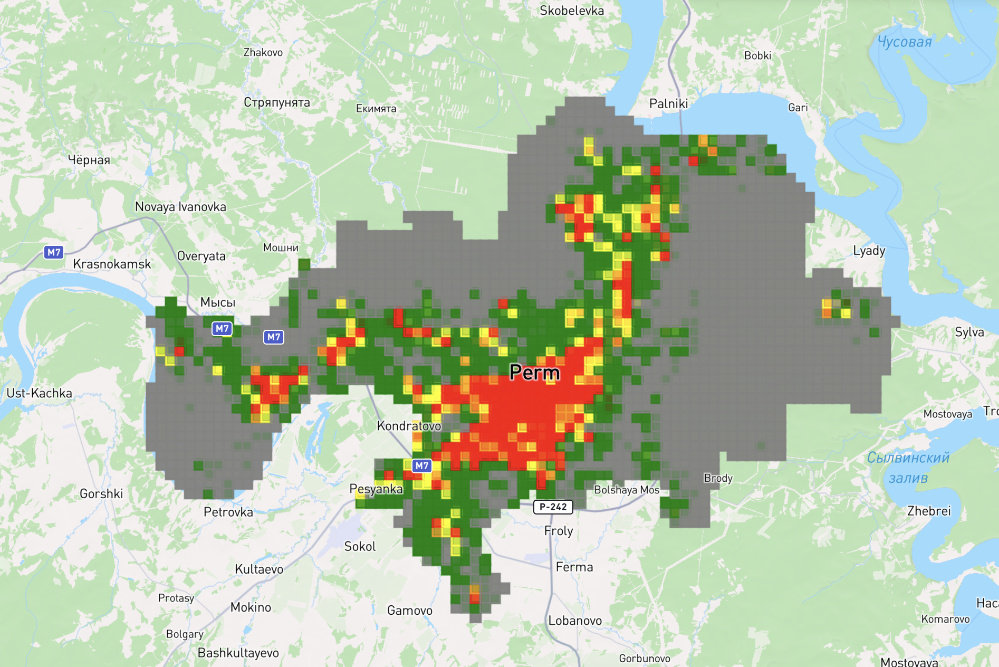
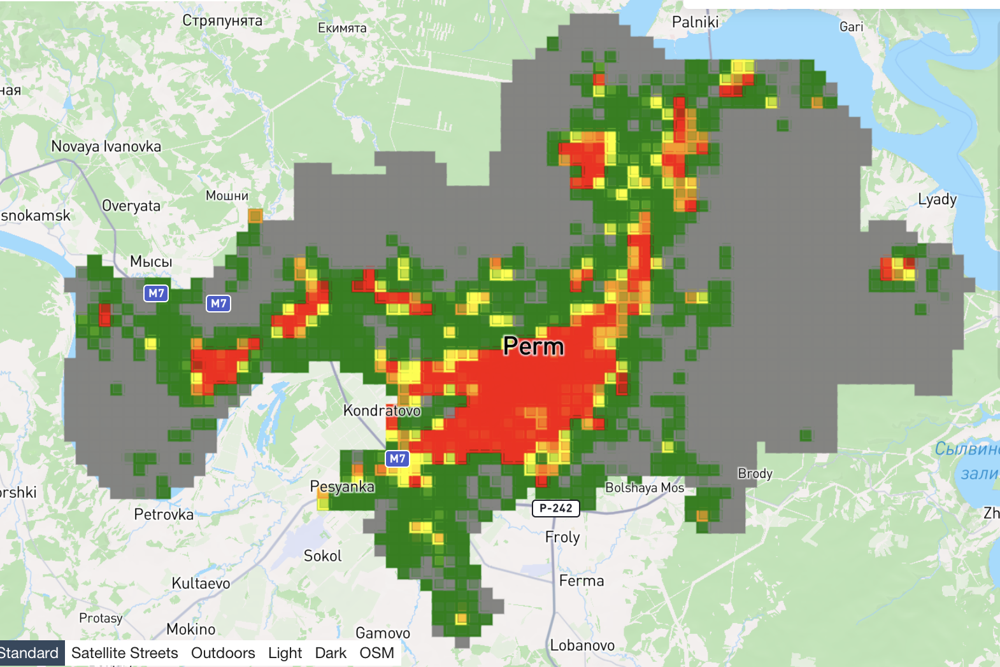
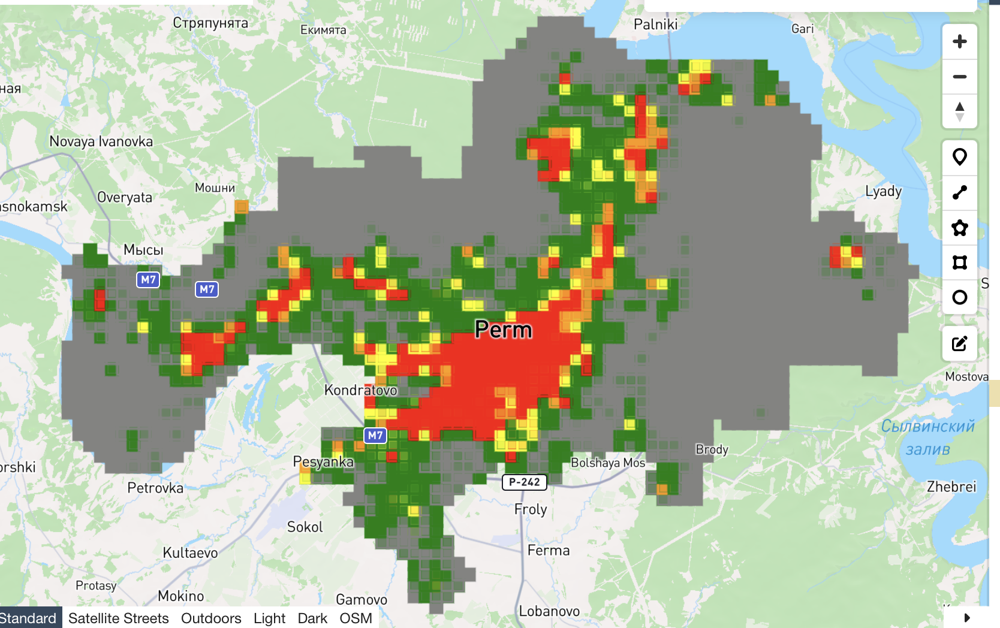

При анализе распределения численности населения по разным зонам мобильного оператора выявляется, что есть районы, где преобладает большее количество людей в каждой из зон (рабочей, ночной и домашней). 
В основном это: **центральные районы Перми или районы ближе к центру, также районы ближе к Закамску и Орджоникидзевский район**

Высокая численность в этих районах может указывать на то, что данные районы являются популярными местами для проживания, работы.



-----

### Распределение детей до 18 лет по «домашним» локациям на территории г. Перми

In [485]:
children_df = dfs.query('age_name == "меньше 18"').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_home':'sum'})

#Добавлю цвет и код цвета 

#Добавлю в массив с домашней зоной
children_df['stroke'] = children_df['cnt_home'].apply(cod_color)
children_df = children_df[['zid','stroke','coords','type_geom']]

In [487]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(children_df, 'data_children.json', 'MyJSONchild_data')

##### Распределение детей до 18 лет по «домашним» локациям на территории г. Перми

![Распределение_детей_домашняя_зона.png](<attachment:Снимок экрана 2024-04-08 в 20.10.47.png>)
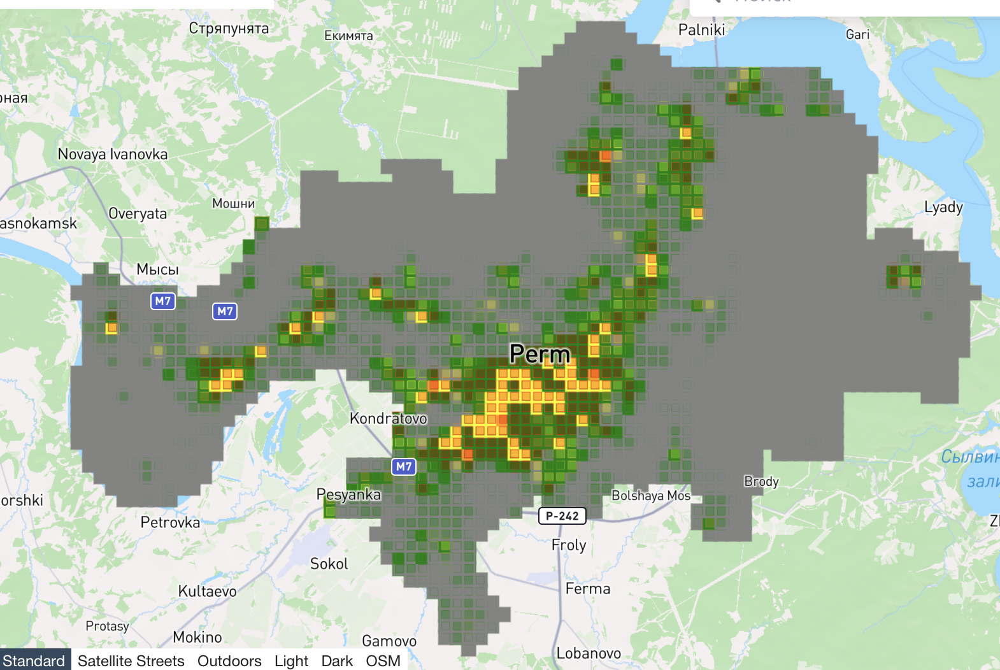

Данные мобильного оператора показывают, что количество детей в целом невелико, но при этом наблюдаются кучки распределения ближе к центральным районам, а также небольшие облака в отдаленных районах. 

Ближе к центральным районам численность детей выше, это может говорить о том, что, возможно, в центре больше проживает детей. Этому ест ьобъяснение, поскольку некоторые семьи могут предпочитать жить в центральных районах из-за лучшей доступности к удобствам, услугам и образовательным учреждениям, секциям и тд. 

#### Распределение пенсионеров старше 65 лет по «домашним» локациям на территории г. Перми

In [488]:
retired_people = dfs.query('age_name == "65 лет и больше"').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_home':'sum'})

#Добавлю цвет и код цвета 

#Добавлю в массив с домашней зоной
retired_people['stroke'] = retired_people['cnt_home'].apply(cod_color)
retired_people = retired_people[['zid','stroke','coords','type_geom']]

In [490]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(retired_people, 'data_retired.json', 'MyJSONretired_data')

##### Распределение пенсионеров старше 65 лет по «домашним» локациям на территории г. Перми

![Распределение_пенсионеров_домашние_локации.png](<attachment:Снимок экрана 2024-04-11 в 16.41.23.png>)
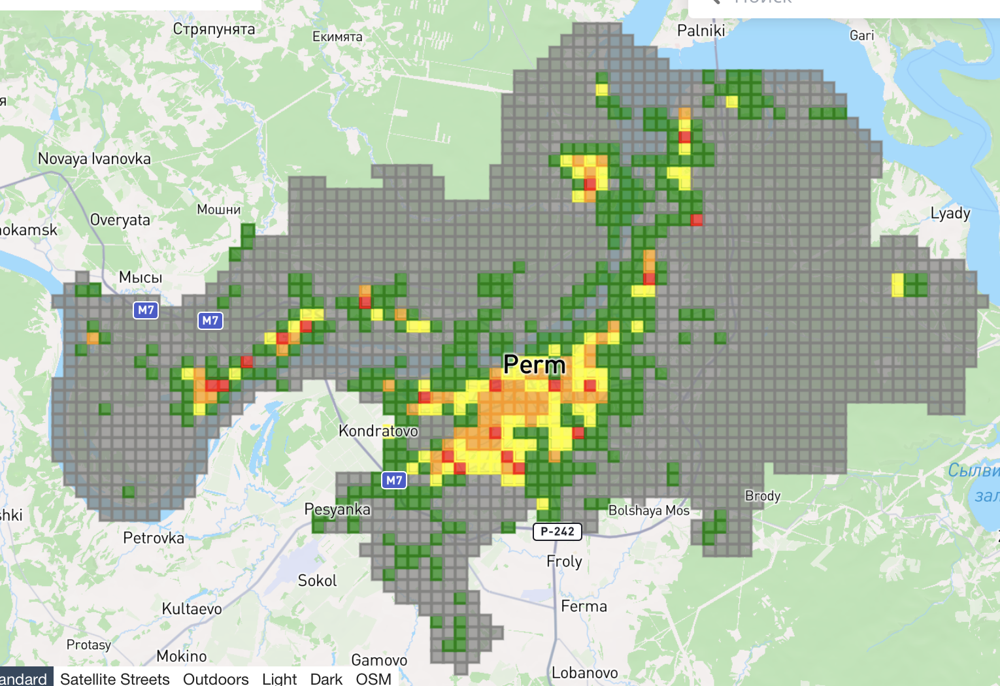

Распределение показывет, что в местах с высокой концентрацией пенсионеров обычно также находятся больницы или медицинские учреждения.

#### Распределение рабочей силы (18-64 лет) по рабочим локациям г. Перми

Возраст:

0. <18 лет
1. 18-24 года 
2. 25-34 года 
3. 35-44 года 
4. 45-54 года 
5. 55-64 года 
6. 65 лет и больше 
7. Н/Д


In [491]:
dfs.head()

,column1,dt,zid,sex,age,income,cnt_home,cnt_work,cnt_night,age_name,sex_name,income_name,cnt_all,coords,type_geom
0,1,2020-02-29,212734969,2,4,5,0,0,0,45-54 года,Женщина,свыше 100 тыс. руб.,0,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon
1,6,2020-02-29,212833274,1,6,1,0,0,0,65 лет и больше,Мужчина,до 30 тыс. руб.,0,"[[[56.184082, 57.885657], [56.184082, 57.89149...",Polygon
2,11,2020-02-29,212866042,1,1,5,0,0,0,18-24 года,Мужчина,свыше 100 тыс. руб.,0,"[[[56.184082, 57.891497], [56.184082, 57.89733...",Polygon
3,13,2020-02-29,212931571,1,3,2,8,0,8,35-44 года,Мужчина,от 30 до 50 тыс. руб.,16,"[[[56.107178, 57.903174], [56.107178, 57.90901...",Polygon
4,14,2020-02-29,212931572,1,6,2,0,0,0,65 лет и больше,Мужчина,от 30 до 50 тыс. руб.,0,"[[[56.118164, 57.903174], [56.118164, 57.90901...",Polygon


In [493]:
working_people = dfs.query('age == 1 or age == 2 or age == 3 or age == 4 or age == 5').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_work':'sum'})

#Добавлю цвет и код цвета 

#Добавлю в массив с рабочей зоной
working_people['stroke'] = working_people['cnt_work'].apply(cod_color)
working_people = working_people[['zid','stroke','coords','type_geom']]

In [495]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(working_people, 'data_working_people.json', 'MyJSONworking_people_data')

#### Распределение рабочей силы (18-64 лет) по рабочим локациям г. Перми

![Распределение рабоче силы.png](<attachment:Снимок экрана 2024-04-11 в 15.45.19.png>)
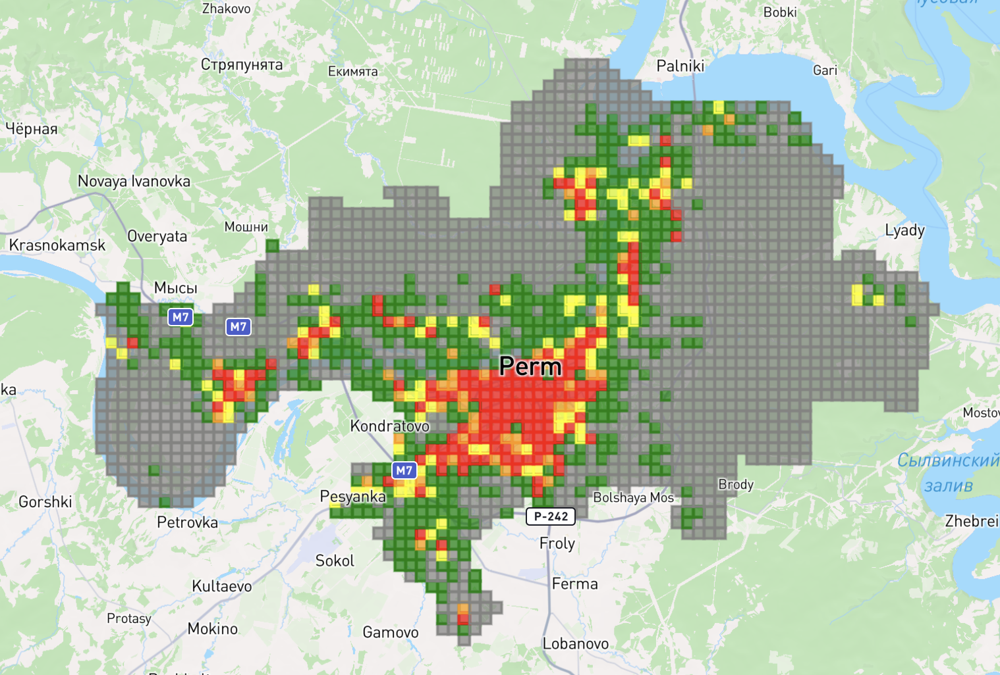

Анализ **распределения людей по рабочим зонам** показывает ярко выраженные скопления населения в центре, что свидетельствует о высокой плотности населения в деловом центре. 
Небольшие кучки людей в отдаленных районах могут быть связаны с наличием предприятий, офисов или других рабочих мест, которые привлекают сотрудников и работников в эти отдаленные районы. Такие районы могут быть центрами промышленности, складов или других объектов, где люди работают или проводят время.

Вот кусок индустриального района Перми ул. Промышленная. Тут находится несколько предприятий: 
- Пермский завод нестандартного оборудования
- Химпром
- Лукойл Пермнефтеоргсинтез и др предприятия. 

![Снимок экрана 2024-04-11 в 15.53.32.png](<attachment:Снимок экрана 2024-04-11 в 15.53.32.png>)
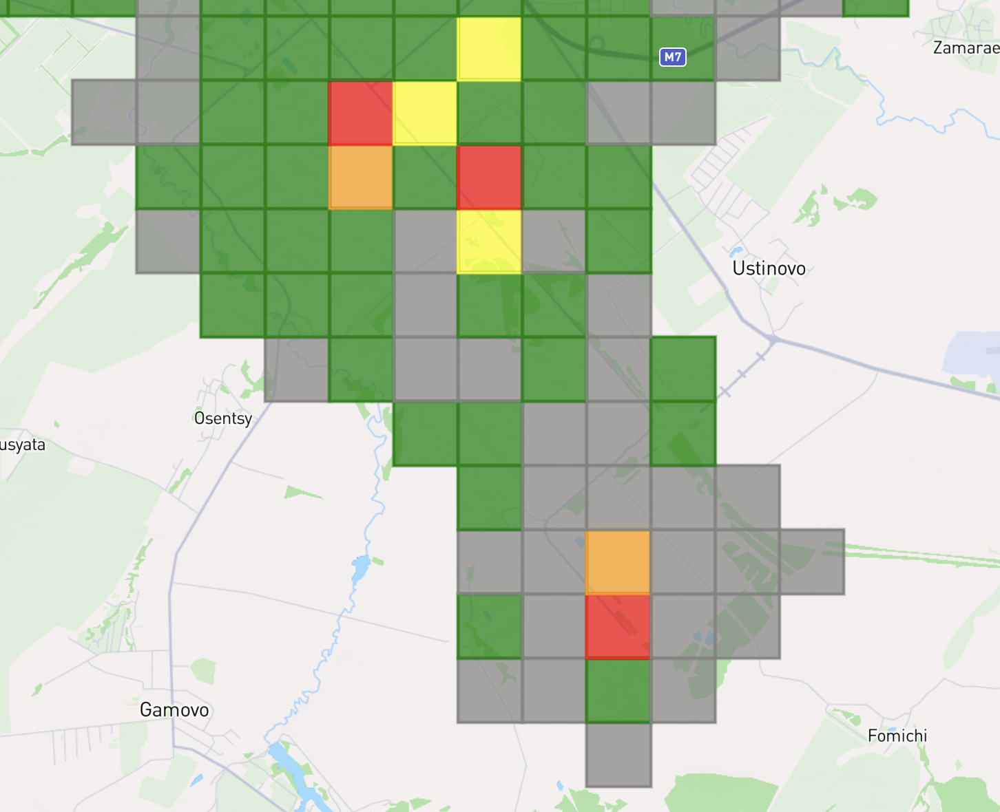

#### Соотношение мужчин/женщин в возрасте 18-24 лет в локациях в г. Перми без учета типа локации, в локации должно быть не меньше 100 человек

In [496]:
dfs.head()

,column1,dt,zid,sex,age,income,cnt_home,cnt_work,cnt_night,age_name,sex_name,income_name,cnt_all,coords,type_geom
0,1,2020-02-29,212734969,2,4,5,0,0,0,45-54 года,Женщина,свыше 100 тыс. руб.,0,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon
1,6,2020-02-29,212833274,1,6,1,0,0,0,65 лет и больше,Мужчина,до 30 тыс. руб.,0,"[[[56.184082, 57.885657], [56.184082, 57.89149...",Polygon
2,11,2020-02-29,212866042,1,1,5,0,0,0,18-24 года,Мужчина,свыше 100 тыс. руб.,0,"[[[56.184082, 57.891497], [56.184082, 57.89733...",Polygon
3,13,2020-02-29,212931571,1,3,2,8,0,8,35-44 года,Мужчина,от 30 до 50 тыс. руб.,16,"[[[56.107178, 57.903174], [56.107178, 57.90901...",Polygon
4,14,2020-02-29,212931572,1,6,2,0,0,0,65 лет и больше,Мужчина,от 30 до 50 тыс. руб.,0,"[[[56.118164, 57.903174], [56.118164, 57.90901...",Polygon


Первое - посчитаю количество мужчин и женщин в возрасте от 18 до 24 лет в каждой локации в г. Перми.

In [521]:
# Массив с муж.где в каждой локации больше 100 чел 


male_count = dfs.query('age == 1 and sex_name =="Мужчина"').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_home':'sum','cnt_work':'sum','cnt_night':'sum'}) \
        .query('cnt_home > 100 and cnt_work > 100 and cnt_night > 100')

In [522]:
# Массив с жен.где в каждой локации больше 100 чел 


female_count = dfs.query('age == 1 and sex_name =="Женщина"').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_home':'sum','cnt_work':'sum','cnt_night':'sum'}) \
        .query('cnt_home > 100 and cnt_work > 100 and cnt_night > 100')

Сейчас в этих массивах я посчитаю общее кол-во населения по локациям

In [525]:
male_count['total_male_count'] = male_count['cnt_home'] + male_count['cnt_work'] + male_count['cnt_night']

female_count['total_female_count'] = female_count['cnt_home'] + female_count['cnt_work'] + female_count['cnt_night']

In [541]:
male_count = male_count[['zid','coords','type_geom','total_male_count']]

#Добавлю цвет и код цвета 
#Добавлю в массив
male_count['stroke'] = male_count['total_male_count'].apply(cod_color)
male_count = male_count[['zid','stroke','coords','type_geom']]


female_count = female_count[['zid','coords','type_geom','total_female_count']]

#Добавлю цвет и код цвета 
#Добавлю в массив
female_count['stroke'] = female_count['total_female_count'].apply(cod_color)
female_count = female_count[['zid','stroke','coords','type_geom']]

/var/folders/4j/vmcpdtvd4639j98wbjhbvtdm0000gp/T/ipykernel_46592/3373730430.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female_count['color'] = female_count['total_female_count'].apply(add_color)
/var/folders/4j/vmcpdtvd4639j98wbjhbvtdm0000gp/T/ipykernel_46592/3373730430.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female_count['stroke'] = female_count['total_female_count'].apply(cod_color)


In [544]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(male_count, 'data_male_count.json', 'MyJSONmale_count_data')
create_json_from_dataframe(female_count, 'data_female_count.json', 'MyJSONfemale_count_data')

#### Распределение мужчин в возрасте 18-24 лет в локациях Перми.

![Снимок экрана 2024-04-11 в 16.26.10.png](<attachment:Снимок экрана 2024-04-11 в 16.26.10.png>)
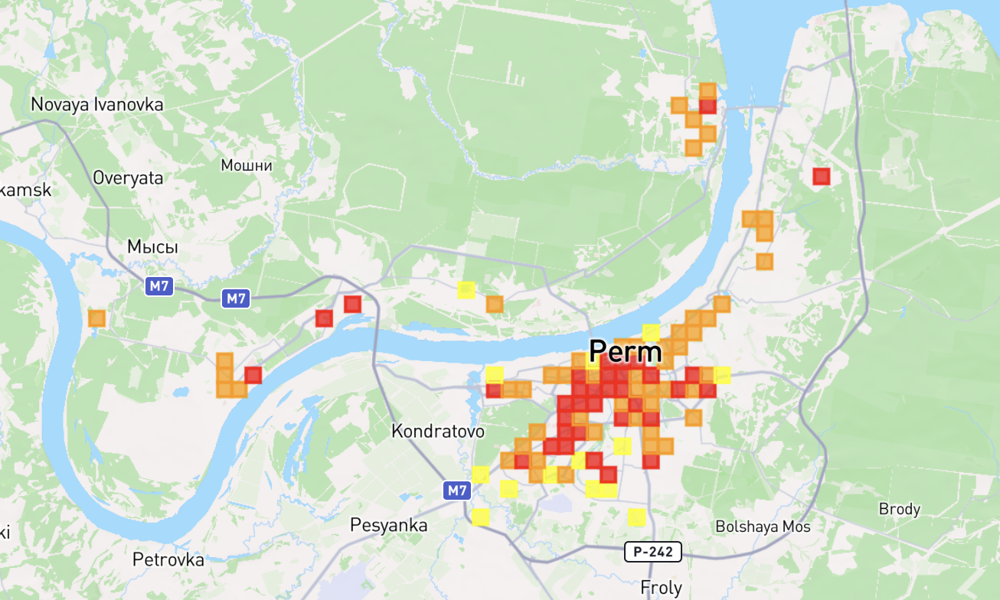

Исходя из предоставленных данных о распределении мужчин от 18 до 24 лет по районам Перми, для поиска потенциального партнера (второй половинки) можно рассмотреть следующие рекомендации:

- **Районы с промышленными предприятиями**: Такие районы могут быть хорошим местом для поиска партнера, поскольку там часто сосредоточены молодые работники и специалисты, что увеличивает шансы найти человека с общими интересами и целями.
- **Близость к центральным местам**: Районы, расположенные ближе к центру города, могут быть также привлекательными для поиска партнера, так как в центре обычно сосредоточено больше развлекательных заведений, кафе, ресторанов и других мест общественного времяпрепровождения.
-**Молодежные районы**: Районы, где проживает большое количество молодых людей, также могут быть перспективными для поиска партнера, так как вероятность встретить человека соответствующего возраста и с общими интересами будет выше.

Выходит так, если вы в поиске партнера, то нужно сосредоточиться на районах с промышленными предприятиями, ближе к центру города и в молодежных районах Перми.

#### Распределение женщин в возрасте 18-24 лет в локациях Перми.

![Снимок экрана 2024-04-11 в 16.29.19.png](<attachment:Снимок экрана 2024-04-11 в 16.29.19.png>)
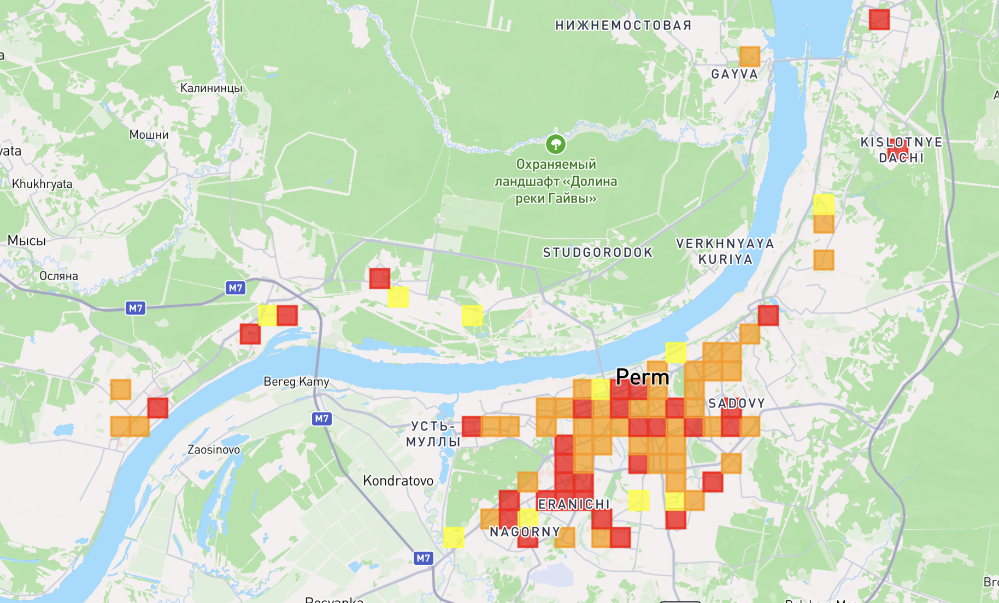

Распределение показывает, что больше молодых женщин проживает в районах, где есть много детских учреждений, развлекательных мест, кафе, и которые расположены ближе к центру города или района, это может говорить о том, что эти районы являются привлекательными и благоприятными для молодых девушек по следующим причинам:

- **Менее опасная и дружеская атмосфера:** Наличие детских учреждений и развлекательных мест в районах свидетельствует о том, что здесь создана комфортная среда, что может быть привлекательно для молодых женщин, особенно тех, кто планирует семью или общение с друзьями.
- **Удобство и комфорт:** Близость к центру города обычно означает лучшую транспортную доступность, развитую инфраструктуру, а также наличие разнообразных услуг и развлечений, что делает такие районы более удобными и комфортными для проживания.
- **Социальная активность:** Районы с развлекательными местами, кафе и другими объектами общественного пользования  - это может быть подходящим вариантов для молодых женщин, стремящихся к общению и новым знакомствам.

#### Распределение населения по «рабочим» локациям с доходом свыше 100 тыс. рублей в г. Перми

In [559]:
#Выделила в массив всех с доходом свыше 100т и рабочая локация
high_income_people = dfs.query('income_name == "свыше 100 тыс. руб."').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_work':'sum'})

In [561]:
#Добавлю цвет зоны
high_income_people['stroke'] = high_income_people['cnt_work'].apply(cod_color)
high_income_people = high_income_people[['zid','stroke','coords','type_geom']]

In [563]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(high_income_people, 'data_high_income_people.json', 'MyJSONhigh_income_people')

#### Распределение населения по рабочим локациям с доходом свыше 100т

![Снимок экрана 2024-04-11 в 16.23.50.png](<attachment:Снимок экрана 2024-04-11 в 16.23.50.png>)
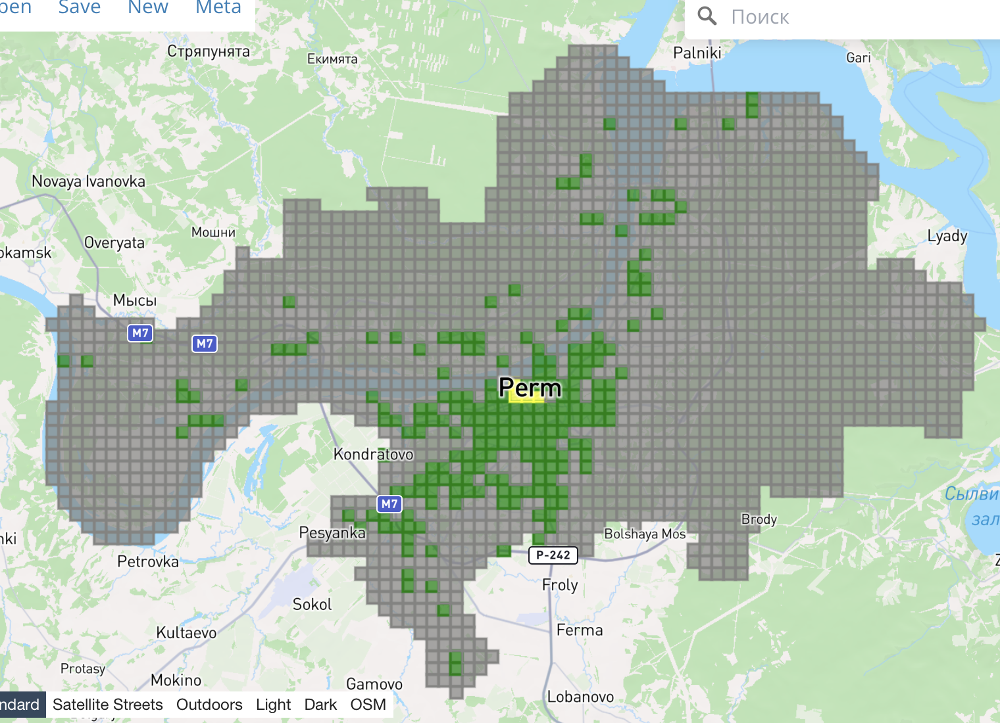

**Центральный район имеет более высокую концентрацию людей с доходом свыше 100 000 рублей**. Поскольку центральный район часто является бизнес-центром города с развитой инфраструктурой, где расположены офисы крупных компаний, финансовые учреждения и другие предприятия, предлагающие высокооплачиваемую работу.

По этому в 2020 году центральный район был источником работ с высоким доходом.

#### Распределение населения по «домашним» локациям с доходом меньше 30 тыс. рублей

In [564]:
#Выделила в массив всех с доходом меньше 30т и домашняя локация
low_income_people = dfs.query('income_name == "до 30 тыс. руб."').groupby(['zid','coords','type_geom'],as_index=False).agg({'cnt_home':'sum'})

In [566]:
#Добавлю цвет зоны
low_income_people['stroke'] = low_income_people['cnt_home'].apply(cod_color)
low_income_people = low_income_people[['zid','stroke','coords','type_geom']]

In [567]:
low_income_people.head()

,zid,stroke,coords,type_geom
0,212702201,848482,"[[[56.173096, 57.862288], [56.173096, 57.86813...",Polygon
1,212734967,848482,"[[[56.151123, 57.868132], [56.151123, 57.87397...",Polygon
2,212734968,008000,"[[[56.162109, 57.868132], [56.162109, 57.87397...",Polygon
3,212734969,848482,"[[[56.173096, 57.868132], [56.173096, 57.87397...",Polygon
4,212734970,848482,"[[[56.184082, 57.868132], [56.184082, 57.87397...",Polygon


In [568]:
#Используем функцию для подготовленный DataFrame
create_json_from_dataframe(low_income_people, 'data_low_income_people.json', 'MyJSONlow_income_people')

#### Распределение населения по «домашним» локациям с доходом меньше 30 тыс. рублей

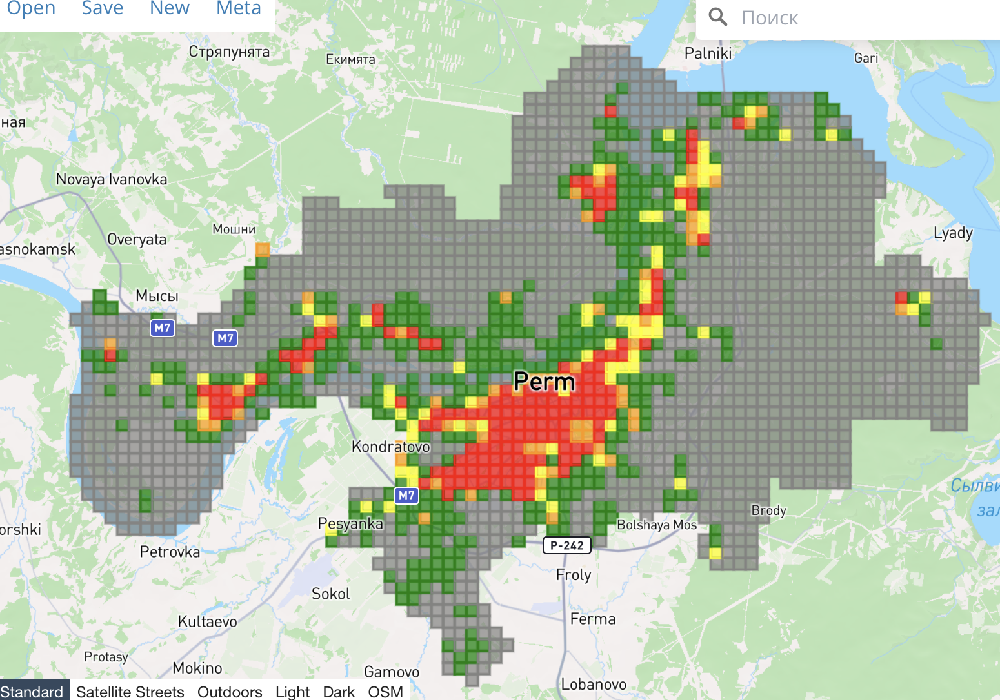

Берем во внимание, что группа людей с доходм до 30т и так преобладает во всем датафрейме и такая категория населения присутствует во всех районах, можно сделать следующий вывод:

- Присутствие значительной части населения с низким уровнем дохода (до 30 000 рублей) во всех районах города указывает на то, что эта социальная группа является широко распространенной и встречается в различных частях города. При этом, несмотря на то, что обычно ожидается, что люди с низким доходом проживают в более отдаленных районах или районах с низким уровнем развития, в данном случае они обнаруживаются во всех частях города.

Возможно, этот факт свидетельствует о широком распространении низких доходов среди населения города в 2020г. 


------

##### Проведеный анализ позволяет вывести усредненный портрет жителя Перми


**Усредненный портрет жителя Перми - ЖЕНЩИНА:**

Женщина в возрасте от 25 до 34 лет, с доходом до 30 или от 30-50 тысяч рублей в месяц, проживающая в районах, которые расположены относительно центра города и характеризуются наличием детских учреждений, развлекательных мест и кафе, что обеспечивает безопасную и дружелюбную атмосферу, удобство и комфорт для проживания, а также способствует социальной активности.

Молодая женщина, которая ценит удобства, безопасность и возможности для общения и развлечений, находясь в относительной близости к центру района.

**Усредненный портрет жителя Перми - МУЖЧИНА:**

Мужчина в возрасте активной трудовой деятельности (от 25 до 45 лет) с доходом до 30 или от 30-50 тысяч рублей в месяц. Он может быть связан с промышленными отраслями или другими видами производтства. Проживает в близлежащих районах, которые могут быть связаны с промышленными предприятиями или быть близкими к центральным местам города, где концентрируется развлекательная инфраструктура и общественные места.
